In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import glob, re

import sys
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import gridspec
from matplotlib import colors

sys.path.append('../../src')
from m3_learning.nn.random import random_seed
from m3_learning.viz.style import set_style
from m3_learning.RHEED.Analysis_umich import fit_curves, analyze_rheed_data, plot_activation_energy, read_txt_to_numpy, select_range

if not os.path.isdir('Saved_data'): os.mkdir('Saved_data')
set_style("printing")
random_seed(seed=42)

printing set for seaborn
Pytorch seed was set to 42
Numpy seed was set to 42
tensorflow seed was set to 42


In [4]:
file = './Saved_data/rheed_data/PM16_STO/650C_secondorder.txt'
range = (30, 40)
print(file)
data = np.loadtxt(file)
data = select_range(data, *range)
sample_x, sample_y = data[:,0], data[:,1]

plt.figure(figsize=(10, 5))
plt.plot(sample_x, sample_y)
plt.show()

./Saved_data/rheed_data/PM16_STO/650C_secondorder.txt


ValueError: could not convert string 'Elapsed' to float64 at row 0, column 1.

./Saved_data/8-21-2023\STO 650C PeterManualRelaxation (.33Hz-33ms).txt


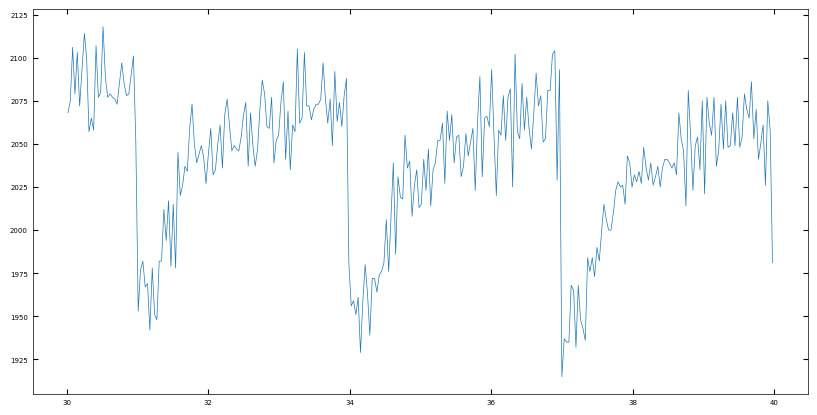

./Saved_data/8-21-2023\STO 670C PeterManualRelaxation (.33Hz-33ms).txt


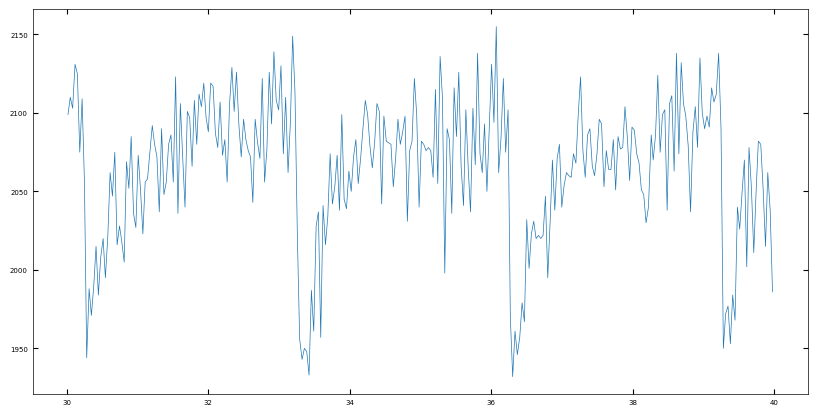

./Saved_data/8-21-2023\STO 690C PeterManualRelaxation (.33Hz-33ms).txt


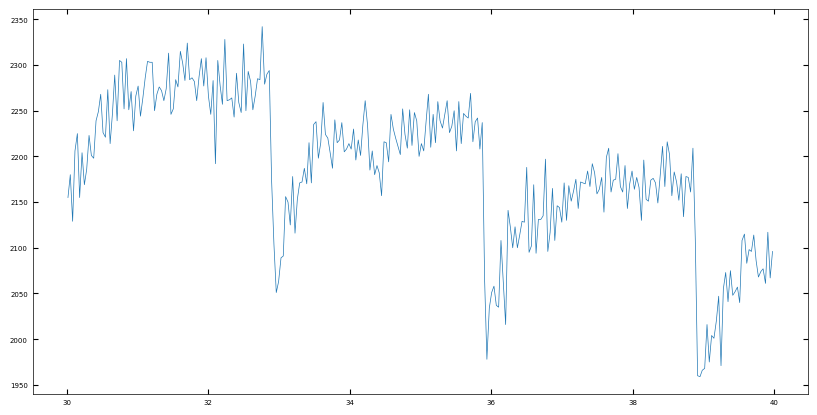

./Saved_data/8-21-2023\STO 710C PeterManualRelaxation (.33Hz-33ms).txt


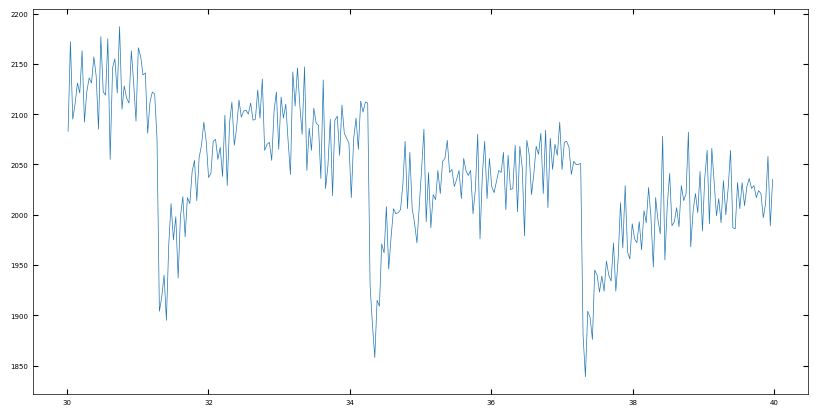

./Saved_data/8-21-2023\STO 730C PeterManualRelaxation (.33Hz-33ms).txt


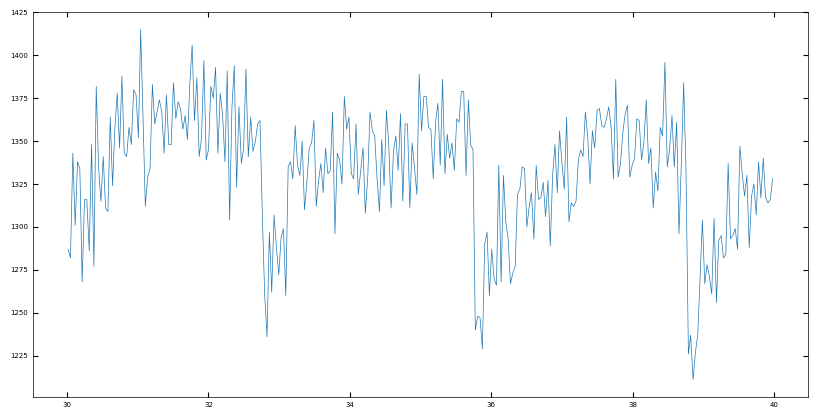

In [3]:
for file in glob.glob('./Saved_data/8-21-2023/*.txt'):
    range = (30, 40)
    print(file)
    data = np.loadtxt(file)
    data = select_range(data, *range)
    sample_x, sample_y = data[:,0], data[:,1]

    plt.figure(figsize=(10, 5))
    plt.plot(sample_x, sample_y)
    plt.show()

./Saved_data/8-21-2023\STO 650C PeterManualRelaxation (.33Hz-33ms).txt


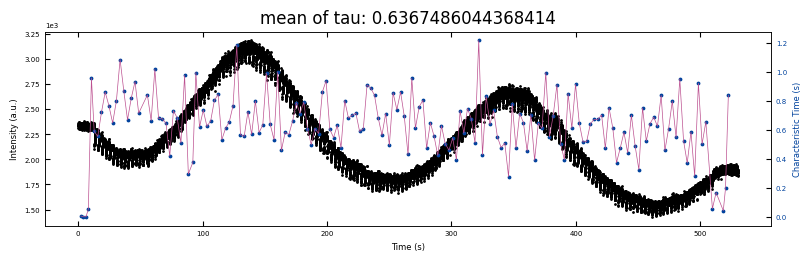

./Saved_data/8-21-2023\STO 670C PeterManualRelaxation (.33Hz-33ms).txt


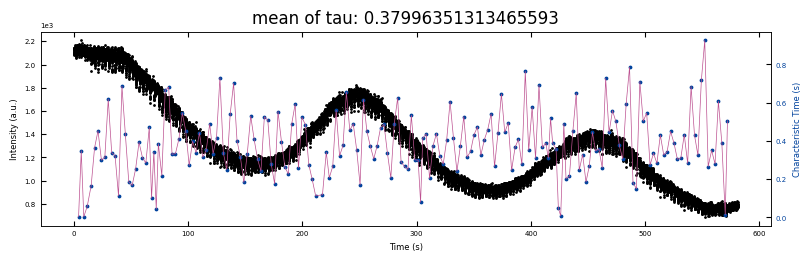

./Saved_data/8-21-2023\STO 690C PeterManualRelaxation (.33Hz-33ms).txt


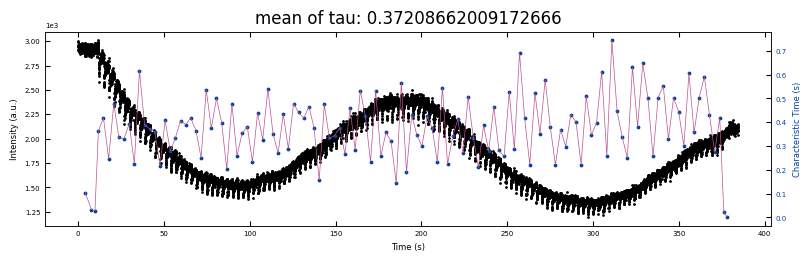

./Saved_data/8-21-2023\STO 710C PeterManualRelaxation (.33Hz-33ms).txt


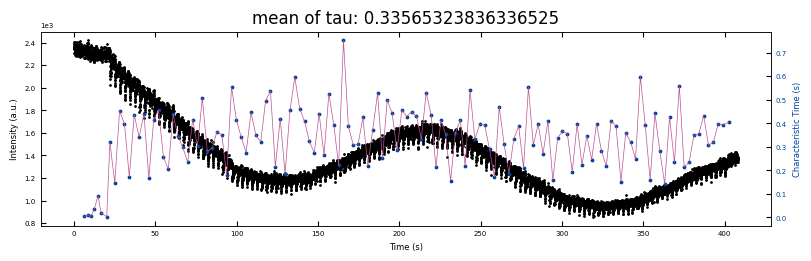

./Saved_data/8-21-2023\STO 730C PeterManualRelaxation (.33Hz-33ms).txt


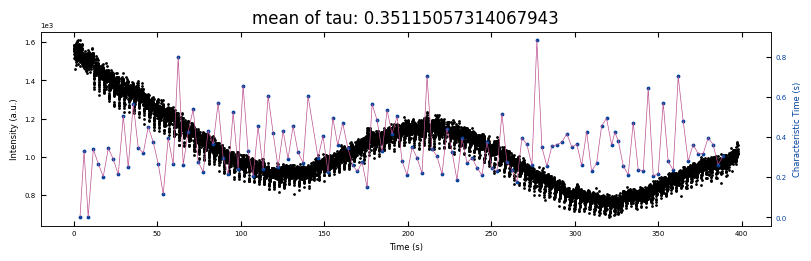

In [18]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 1000/33
laser_freq = 1/3
viz_curves=False
viz_fittings=False
viz_ab=False

tau_list, temp_list = [], []
for file in glob.glob('./Saved_data/8-21-2023/*.txt'):
    print(file)
    if os.path.isfile(file):
        temp = int(re.split(r'[_\s]', file)[2][:3])
        parameters_all, x_list_all, info, tau = analyze_rheed_data(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab, n_std=3)
        # print(file, tau)

        temp_list.append(temp)
        tau_list.append(tau)

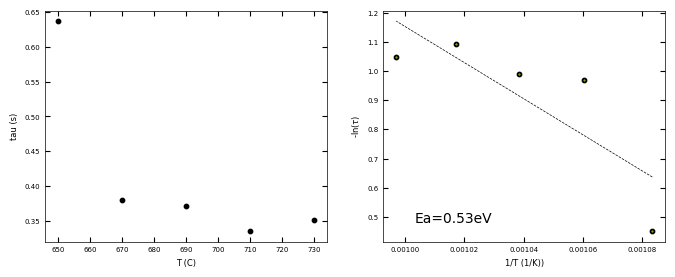

In [19]:
plot_activation_energy(temp_list, tau_list)

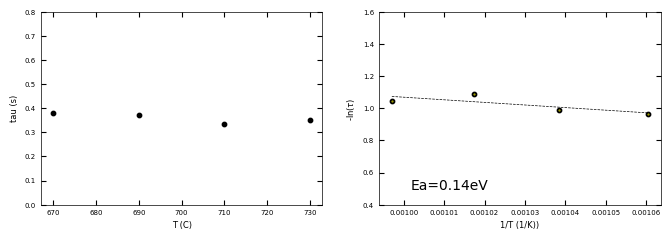

In [21]:
plot_activation_energy(temp_list[1:], tau_list[1:], ylim1=(0,0.8), ylim2=(0.4,1.6))

In [50]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=False
viz_fittings=False
viz_ab=False

tau_list, temp_list = [], []
file = './Saved_data/8-21-2023/STO 650C PeterManualRelaxation (.33Hz-33ms).txt'
parameters_all, x_list_all, info, tau = analyze_rheed_data(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
tau_list.append(tau)
temp_list.append(650)

file = './Saved_data/8-21-2023/STO 670C PeterManualRelaxation (.33Hz-33ms).txt'
parameters_all, x_list_all, info, tau = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
tau_list.append(tau)
temp_list.append(670)

file = './Saved_data/8-21-2023/STO 690C PeterManualRelaxation (.33Hz-33ms).txt'
parameters_all, x_list_all, info, tau = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
tau_list.append(tau)
temp_list.append(690)

file = './Saved_data/8-21-2023/STO 710C PeterManualRelaxation (.33Hz-33ms).txt'
parameters_all, x_list_all, info, tau = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
tau_list.append(tau)
temp_list.append(710)

file = './Saved_data/8-21-2023/STO 730C PeterManualRelaxation (.33Hz-33ms).txt'
parameters_all, x_list_all, info, tau = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)
tau_list.append(tau)
temp_list.append(730)

TypeError: fit_curves() missing 1 required positional argument: 'fit_settings'

TypeError: expected non-empty vector for x

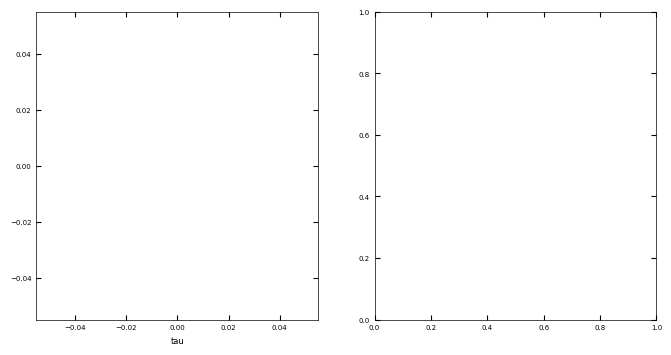

In [3]:
fig, axes = plt.subplots(1, 2, figsize=(8,4))

T = np.array(temp_list) + 273
tau = np.array(tau_list)

axes[0].scatter(T, tau, color='k', s=10)
axes[0].set_xlabel('T')
axes[0].set_xlabel('tau')

x = 1/(T)
y = -np.log(tau)
m, b = np.polyfit(x, y, 1)

axes[1].scatter(x, y, color='k', s=10)
axes[1].plot(x, y, 'yo', x, m*x+b, '--k')
axes[1].set_xlabel('1/T (1/K))')
axes[1].set_ylabel(r'-ln($\tau$)')
axes[1].set_title('Activation Energy: ' + str(round(m*8.617e-5, 2)) + ' eV')
plt.show()

-6106.287211418188 8.397756620110144


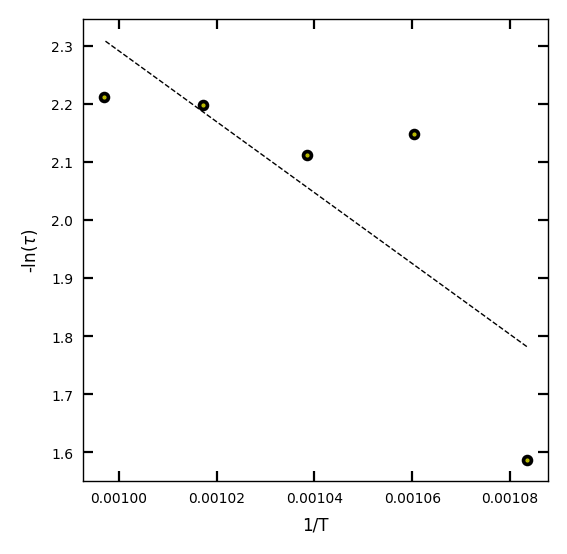

In [102]:
fig, axes = plt.subplots(1, 2, figsize=(8,4))

T = np.array(temp_list) + 273
tau = np.array(tau_list)

axes[0].scatter(T, tau, color='k', s=10)
axes[0].set_xlabel('T')
axes[0].set_xlabel('tau')

x = 1/(T)
y = -np.log(tau)
m, b = np.polyfit(x, y, 1)

axes[1].scatter(x, y, color='k', s=10)
axes[1].plot(x, y, 'yo', x, m*x+b, '--k')
axes[1].set_xlabel('1/T (1/K))')
axes[1].set_ylabel(r'-ln($\tau$)')
axes[1].set_title('Activation Energy: ' + str(round(m*8.617e-5, 2)) + ' eV')
plt.show()

-1776.3233763594421 3.9747102803681496


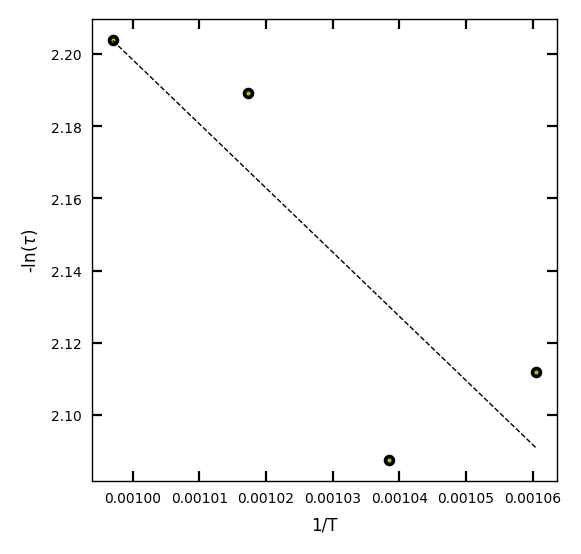

In [83]:
f,ax=plt.subplots(1,1,figsize=(3,3),dpi=200)
T = np.array([670, 690, 710, 730])
tau = np.array([0.121, 0.124, 0.112, 0.11038])
plt.scatter(1/(273+T), -np.log(tau), color='k', s=10)

x = 1/(273+T)
y = -np.log(tau)
m, b = np.polyfit(x, y, 1)

plt.plot(x, y, 'yo', x, m*x+b, '--k')

ax.set_xlabel('1/T')
ax.set_ylabel(r'-ln($\tau$)')
print(m, b)


In [84]:
1176*8.617/10e5

-0.010133592

-6266.229345175526 8.5461209642946


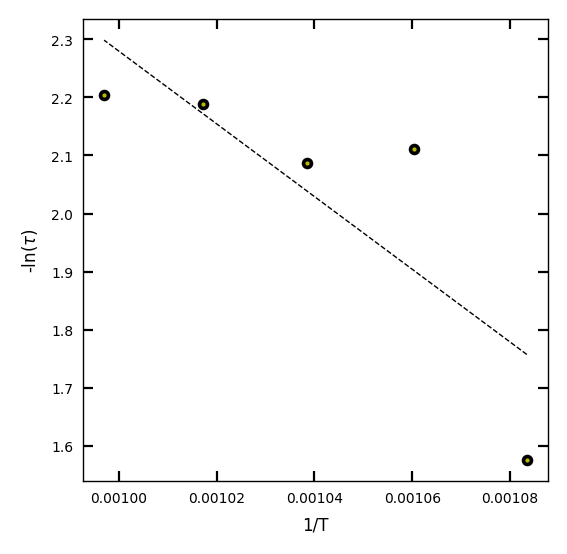

In [85]:
f,ax=plt.subplots(1,1,figsize=(3,3),dpi=200)
T = np.array([650, 670, 690, 710, 730])
tau = np.array([0.207, 0.121, 0.124, 0.112, 0.11038])
plt.scatter(1/(273+T), -np.log(tau), color='k', s=10)

x = 1/(273+T)
y = -np.log(tau)
m, b = np.polyfit(x, y, 1)

plt.plot(x, y, 'yo', x, m*x+b, '--k')

ax.set_xlabel('1/T')
ax.set_ylabel(r'-ln($\tau$)')
print(m, b)


In [87]:
6266.229345175526*8.617/10e5

0.053996098267377515

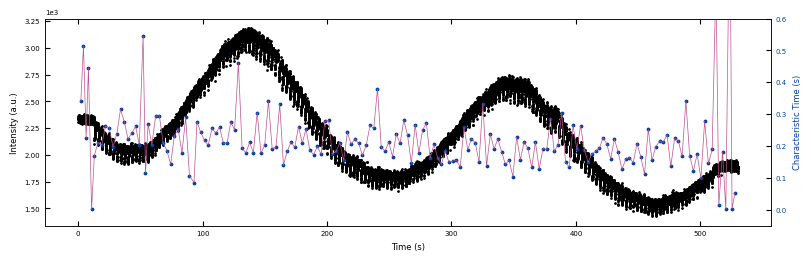

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(8, 2.5), layout='compressed')
ax1.scatter(sample_x, sample_y, color='k', s=1)
Viz.set_labels(ax1, xlabel='Time (s)', ylabel='Intensity (a.u.)', ticks_both_sides=False)

ax2 = ax1.twinx()
ax2.scatter(x_list_all, parameters[:,2], color=seq_colors[0], s=3)
ax2.plot(x_list_all,  parameters[:,2], color='#bc5090', markersize=3)
Viz.set_labels(ax2, ylabel='Characteristic Time (s)', yaxis_style='lineplot', ylim=(-0.05, 0.6), ticks_both_sides=False)
ax2.tick_params(axis="y", color='k', labelcolor=seq_colors[0])
ax2.set_ylabel('Characteristic Time (s)', color=seq_colors[0])
plt.show()

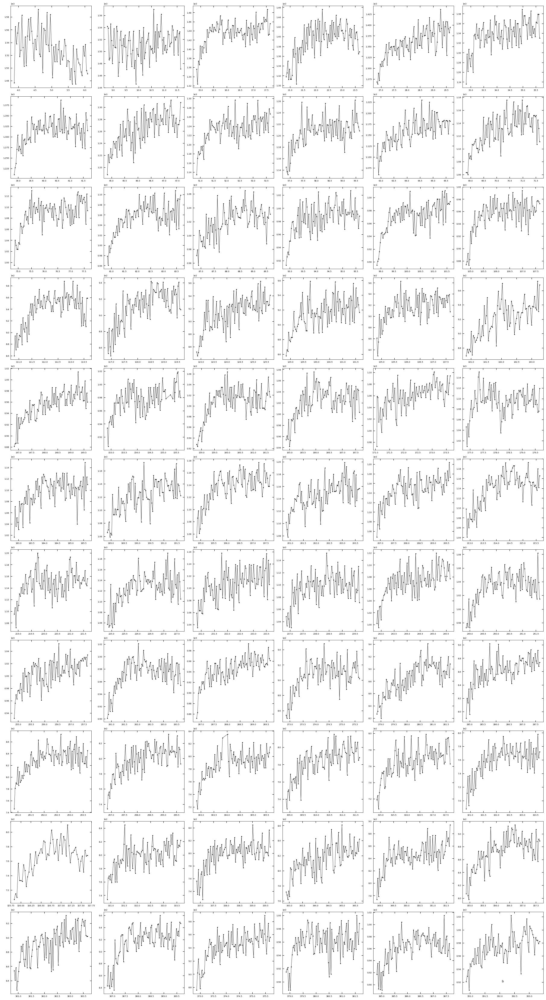

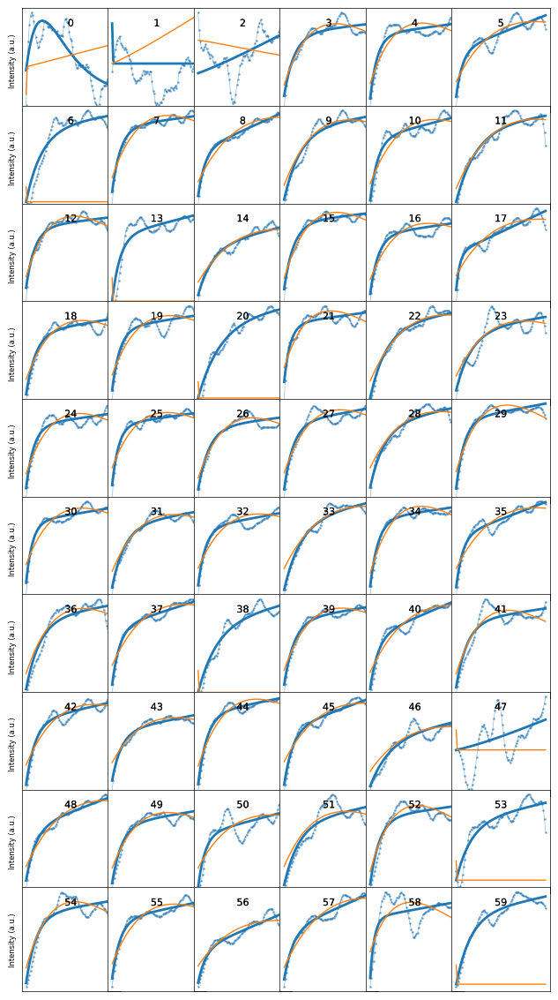

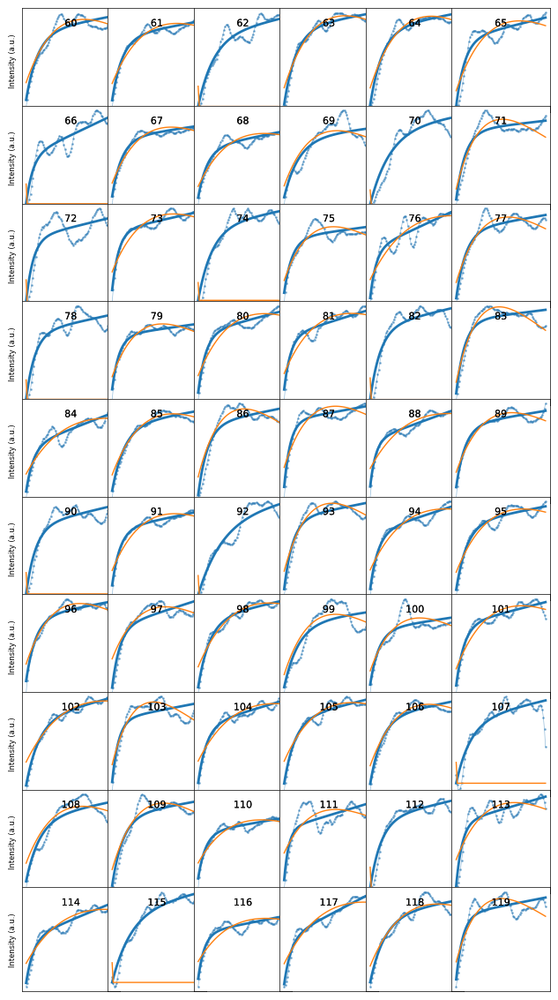

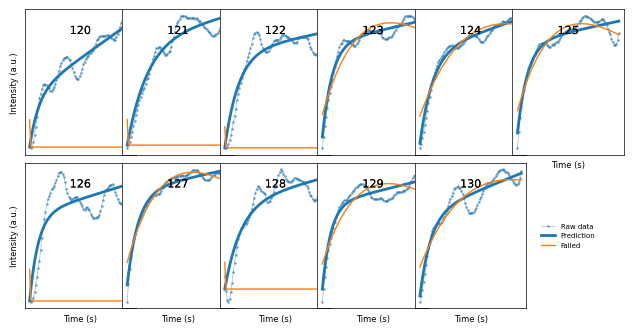

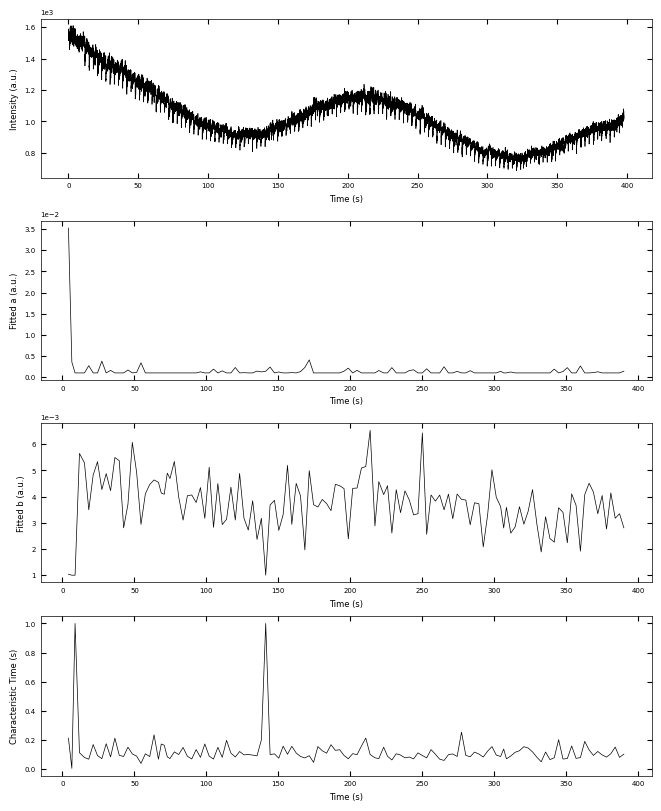

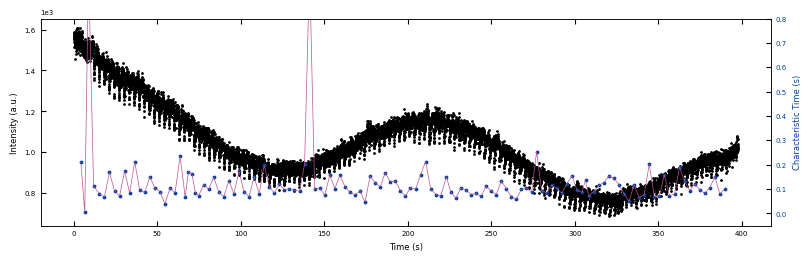

0.11038181200664025


In [75]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 730C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

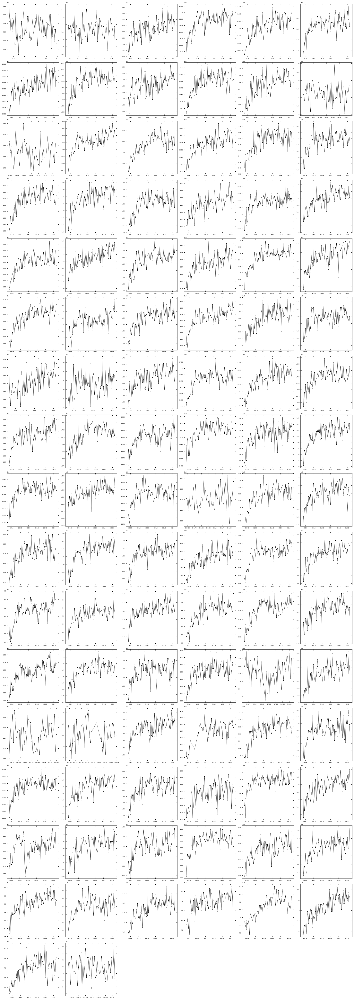

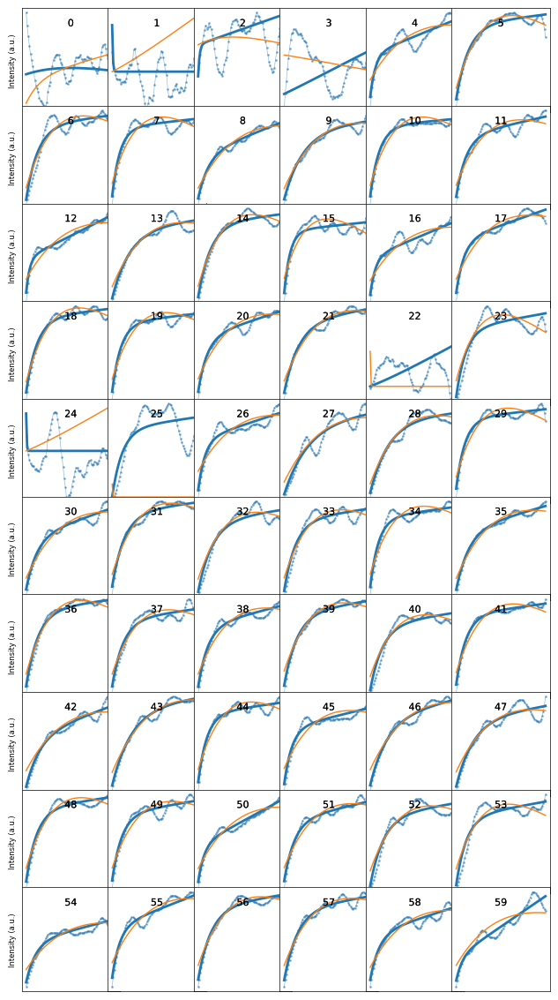

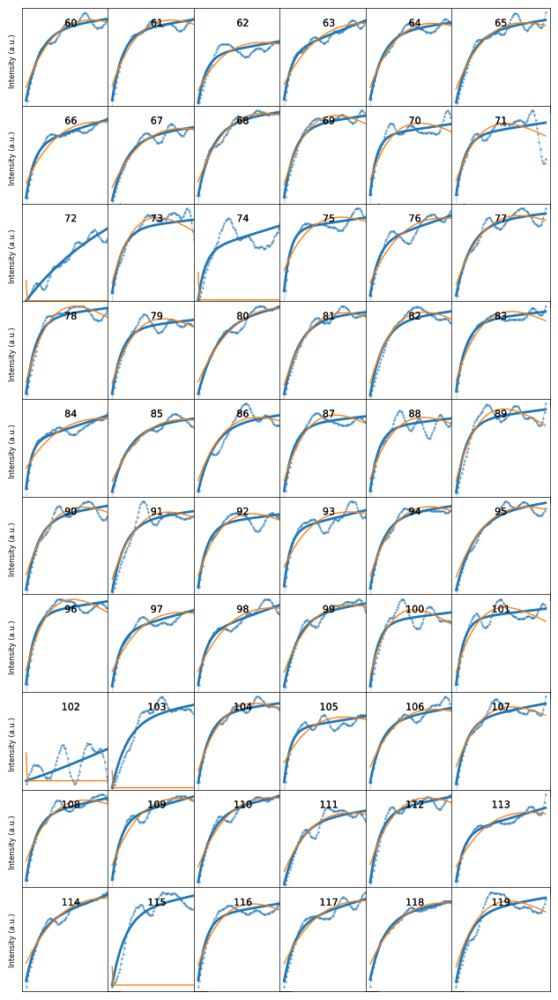

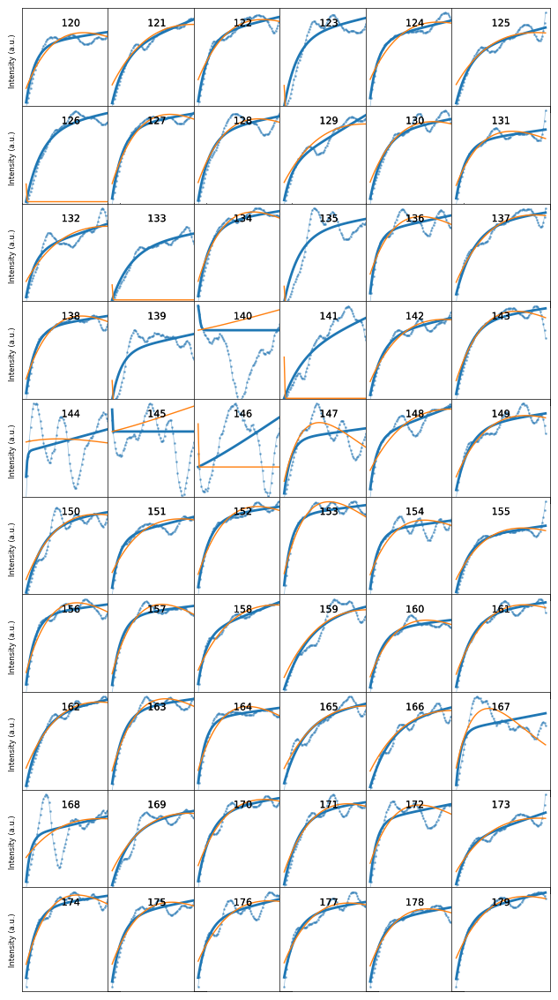

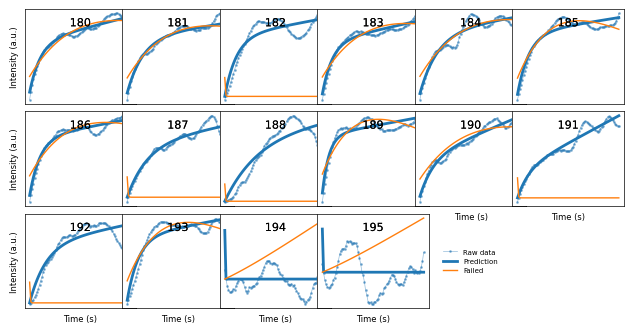

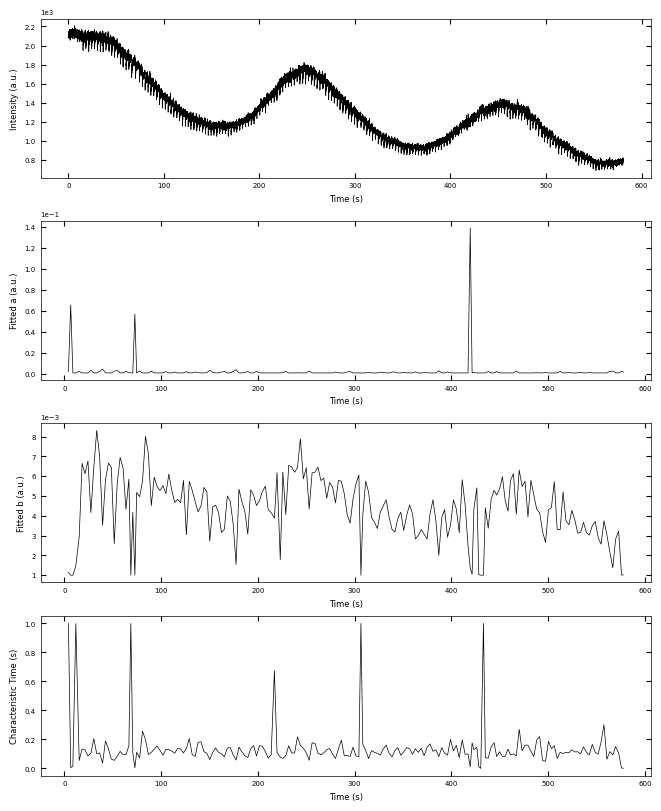

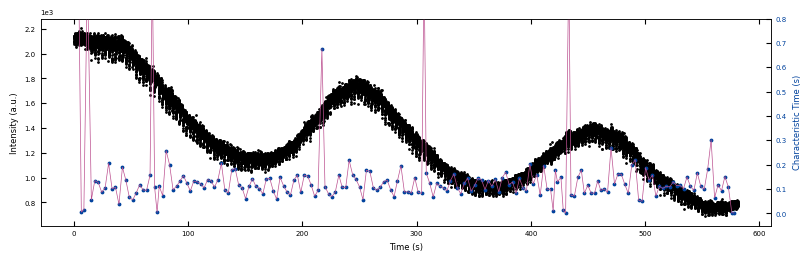

In [41]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 670C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

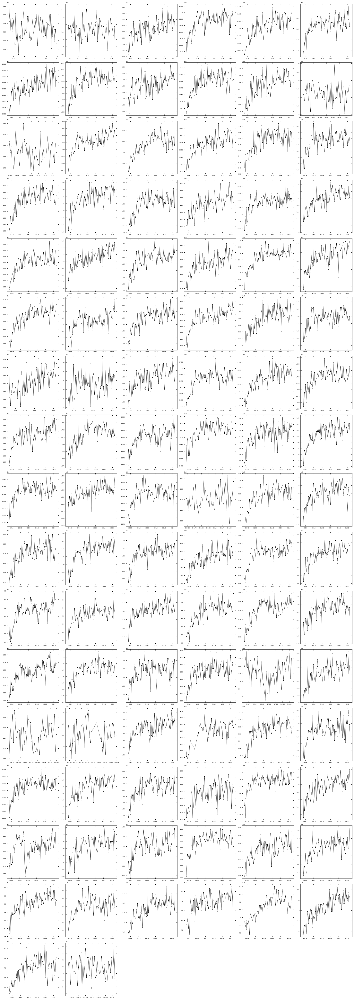

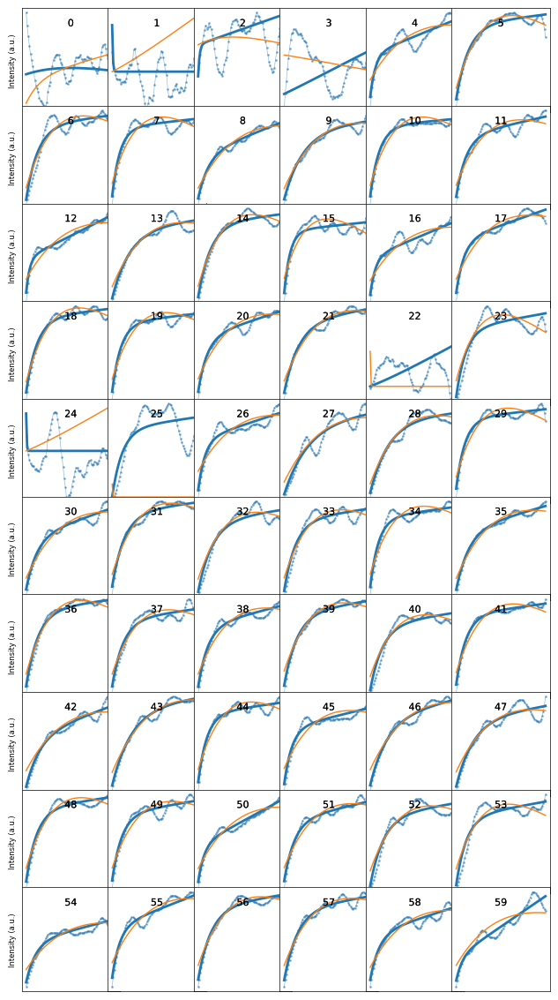

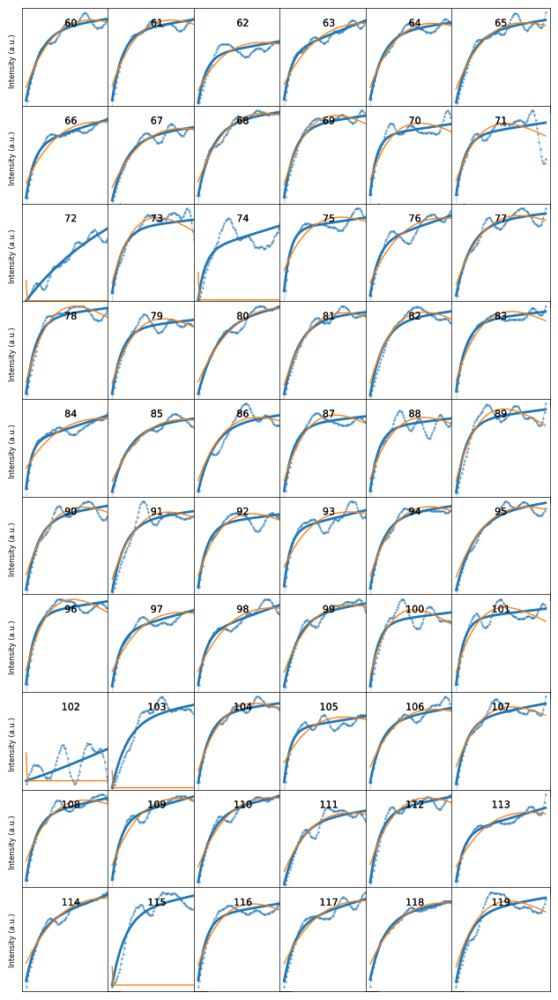

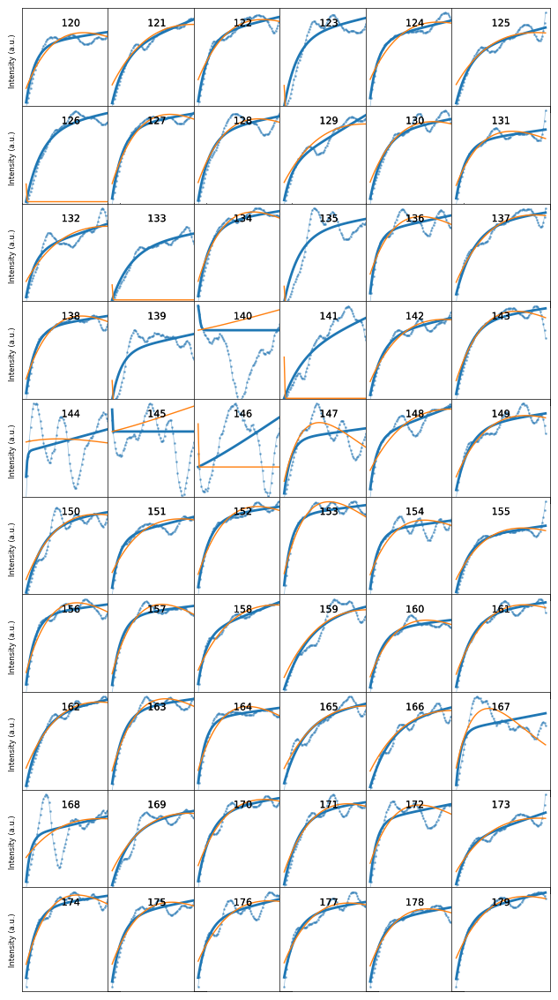

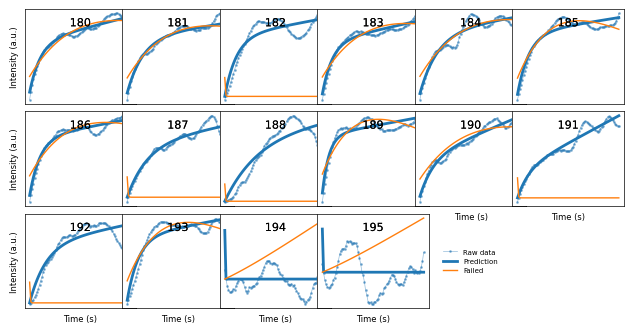

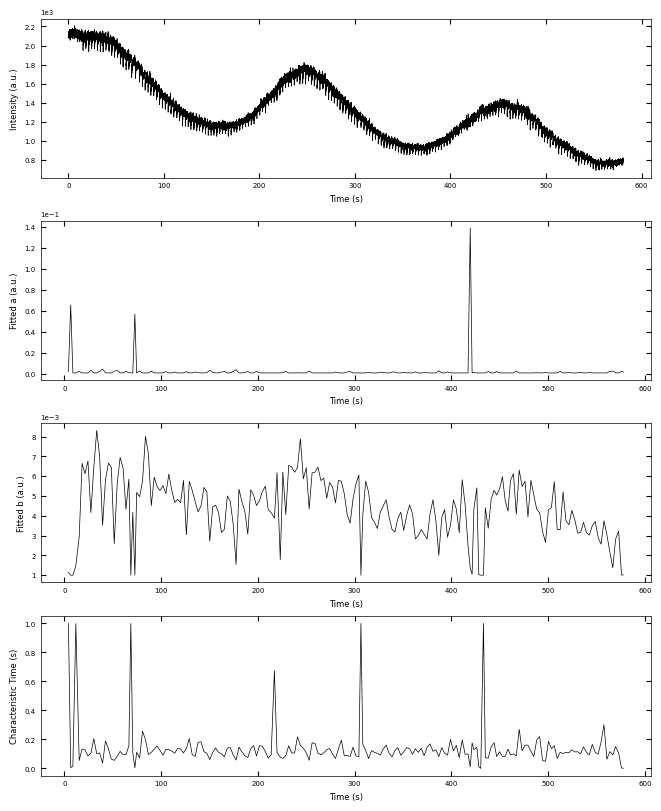

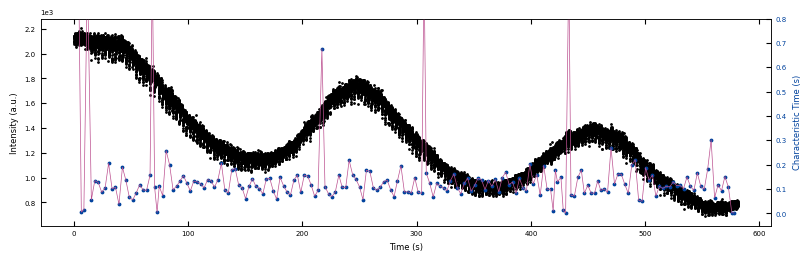

In [37]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 670C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

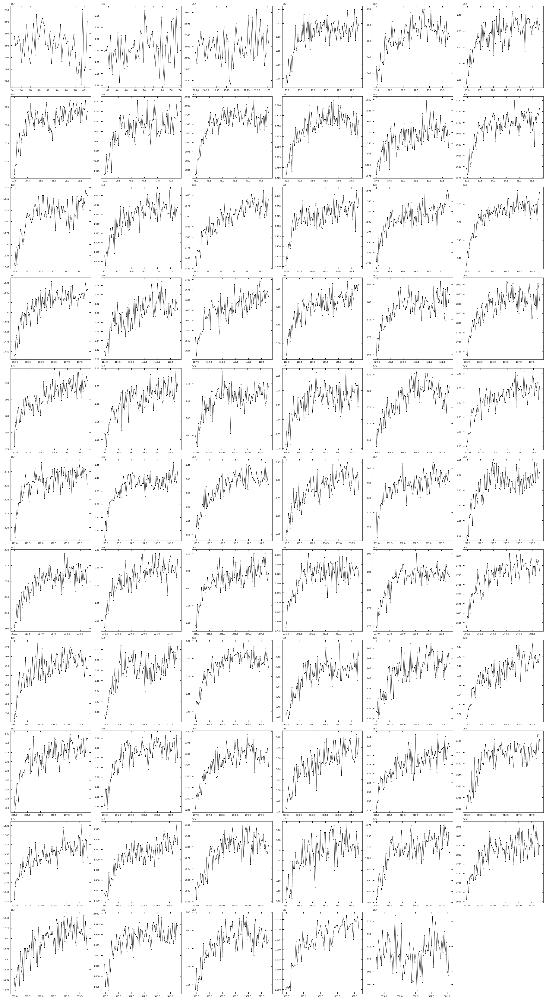

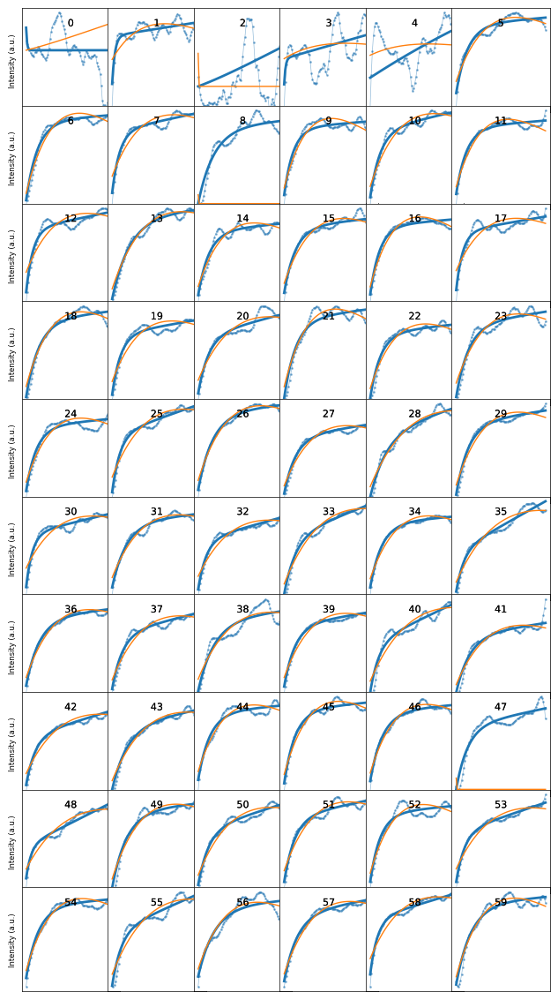

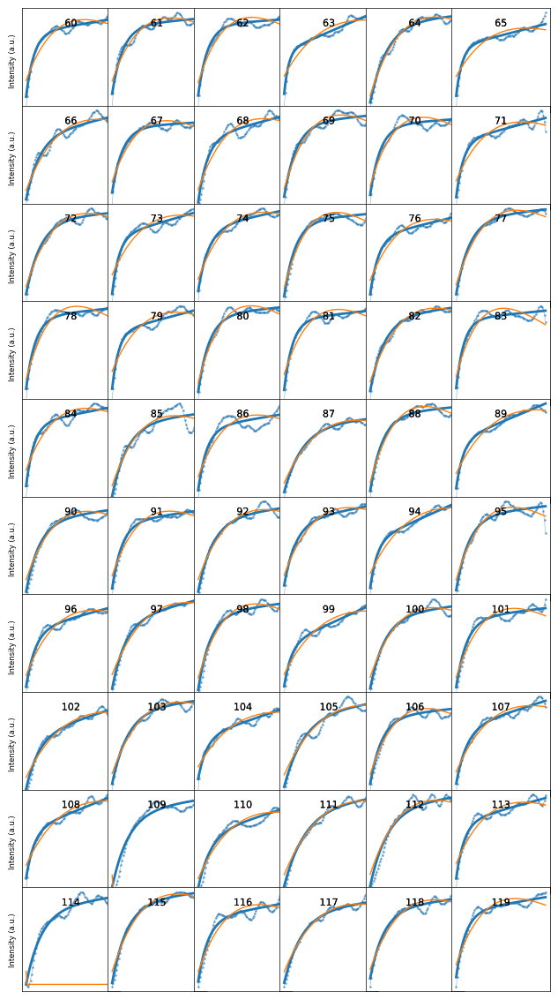

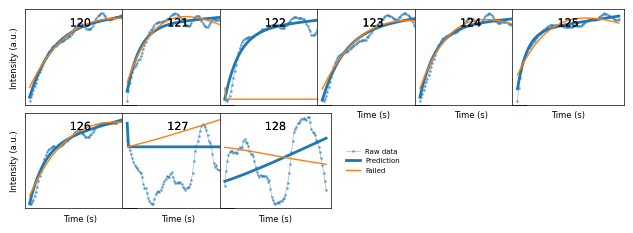

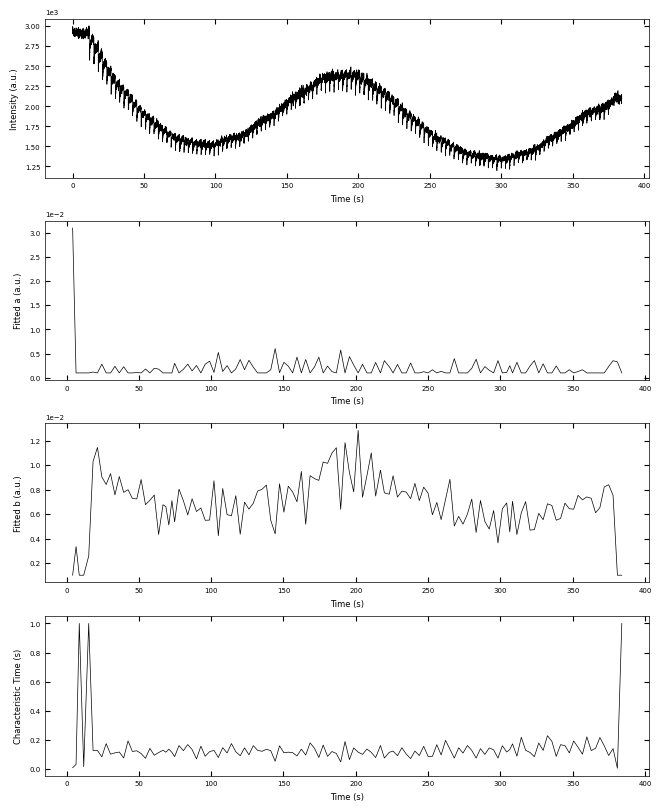

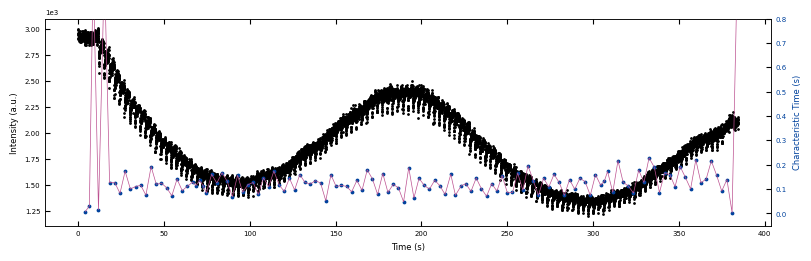

In [38]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 690C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)

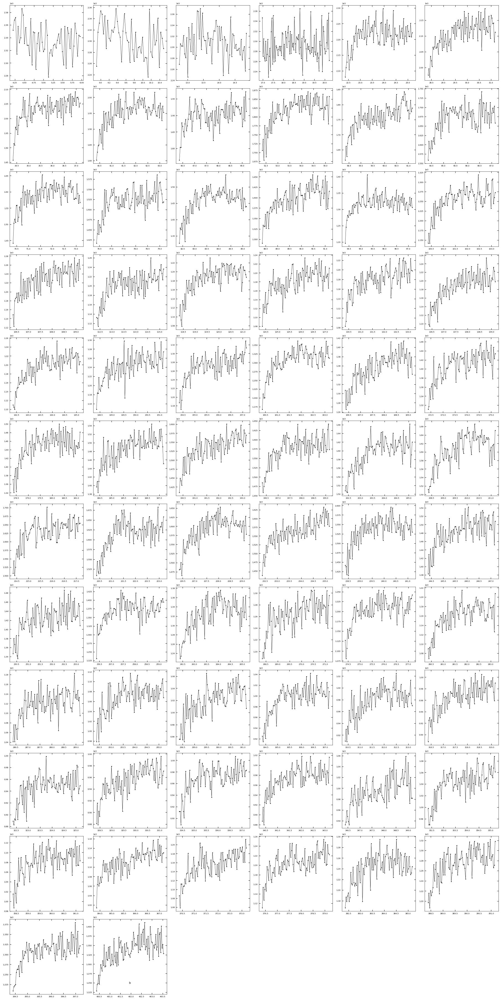

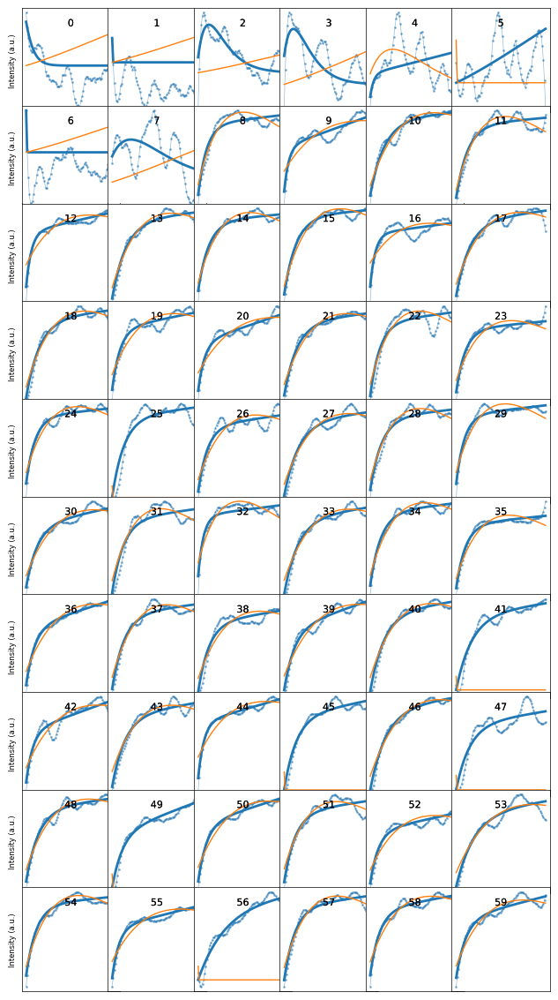

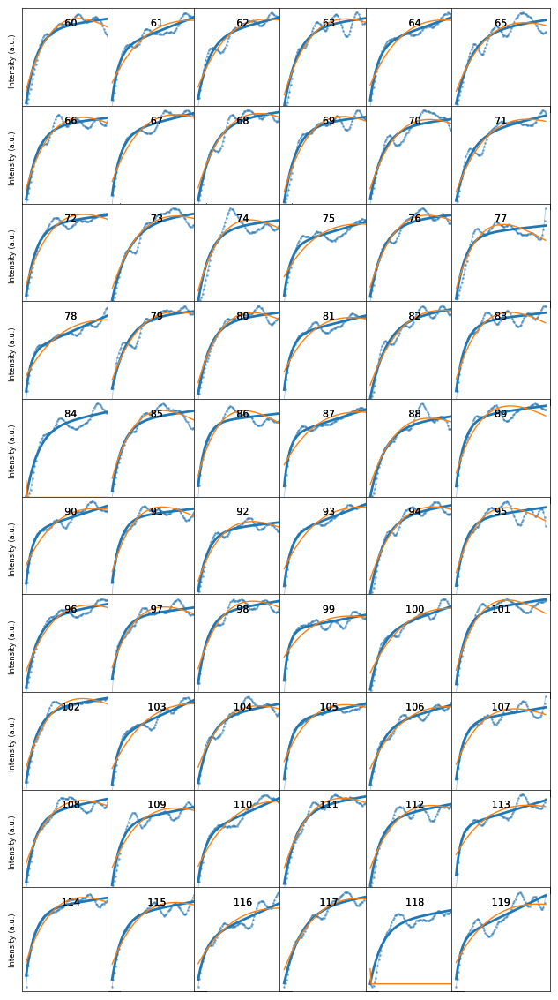

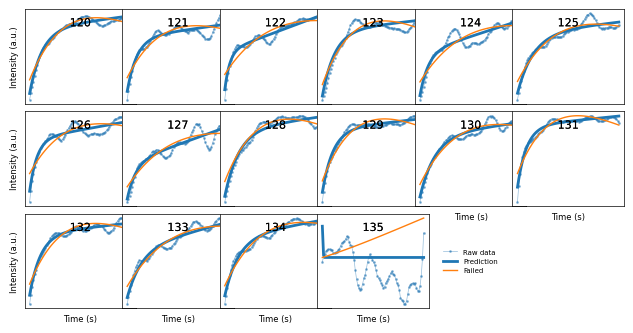

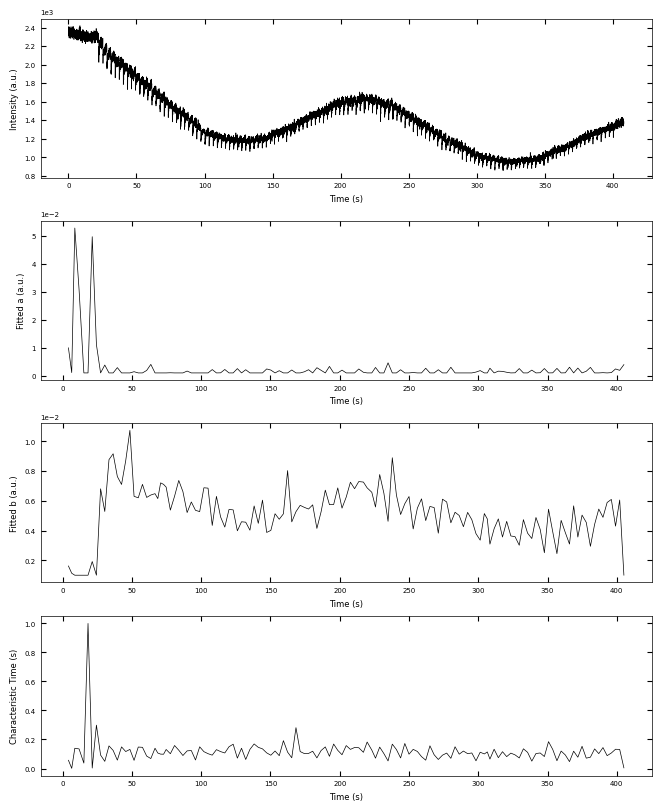

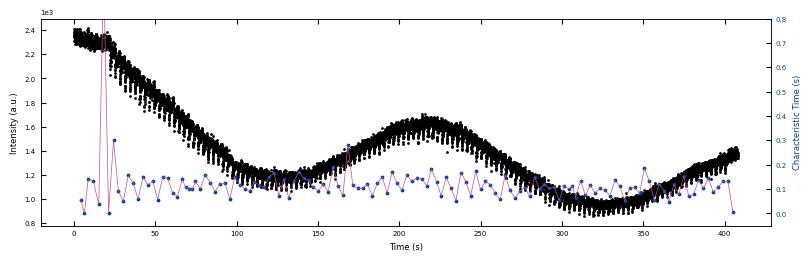

In [39]:
detect_param={'step_size':3, 'prominence':10}
camera_freq = 30
laser_freq = 0.33
viz_curves=True
viz_fittings=True
viz_ab=True
file = './Datasets/8-21-2023/STO 710C PeterManualRelaxation (.33Hz).txt'
parameters_all, x_list_all, info = analyze_txt_rheed(file, camera_freq, laser_freq, detect_param, viz_curves, viz_fittings, viz_ab)